***
# `ML project` - `Binary Classfication on income dataset of Adults`  
***
### **Dataset : [Adult.csv](https://www.kaggle.com/datasets/wenruliu/adult-income-dataset)**

## `Dataset`


**Data Set Information:**

- Extraction was done by Barry Becker from the 1994 Census database. A set of reasonably clean records was extracted using the following conditions: ((AAGE>16) && (AGI>100) && (AFNLWGT>1)&& (HRSWK>0))

- Prediction task is to determine whether a person makes over 50K a year.


**Attribute Information:**

- Listing of attributes:

- Target: `Income` >50K, <=50K.

- age: continuous.
- workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.
- fnlwgt: continuous.
- education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.
- education-num: continuous.
- marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.
- occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.
- relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.
- race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.
- sex: Female, Male.
- capital-gain: continuous.
- capital-loss: continuous.
- hours-per-week: continuous.
- native-country: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.



***

## `1. Importing libraries`

In [1]:
#importing basic libraries to deal with dataset and visualisation

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import warnings
warnings.filterwarnings('ignore')

***

## `2. Importing Dataset`

In [3]:
#loading the dataset from local memory

df=pd.read_csv('/home/msc2//Documents/MDSC/MDSC-301 ML(P)/Datasets/adult.csv')

***

## `3. Exploring dataset`

In [4]:
df.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education.num',
       'marital.status', 'occupation', 'relationship', 'race', 'sex',
       'capital.gain', 'capital.loss', 'hours.per.week', 'native.country',
       'income'],
      dtype='object')

In [5]:
df.head(2)

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education.num   32561 non-null  int64 
 5   marital.status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital.gain    32561 non-null  int64 
 11  capital.loss    32561 non-null  int64 
 12  hours.per.week  32561 non-null  int64 
 13  native.country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


**Inference :**  
- Attributes : 32561  
- Features: 15

In [7]:
df.select_dtypes(include = 'object').nunique()

workclass          9
education         16
marital.status     7
occupation        15
relationship       6
race               5
sex                2
native.country    42
income             2
dtype: int64

In [8]:
df.select_dtypes(include = 'object').isnull().sum()

workclass         0
education         0
marital.status    0
occupation        0
relationship      0
race              0
sex               0
native.country    0
income            0
dtype: int64

In [9]:
df.select_dtypes(include = 'int').isnull().sum()

age               0
fnlwgt            0
education.num     0
capital.gain      0
capital.loss      0
hours.per.week    0
dtype: int64

In [10]:
#population of males and females in other columns

df.groupby('sex').mean(numeric_only=True)

,age,fnlwgt,education.num,capital.gain,capital.loss,hours.per.week
sex,,,,,,
Female,36.858230,185746.311206,10.035744,568.410547,61.187633,36.410361
Male,39.433547,191771.449013,10.102891,1329.370078,100.213309,42.428086


In [11]:
#basic stats related to dataset

df.describe()

,age,fnlwgt,education.num,capital.gain,capital.loss,hours.per.week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [12]:
#dataset consisting of only categorical features

df_cat = df.select_dtypes(include ='object')
df_cat=df_cat.drop('income',axis=1)

In [13]:
#This function is to provide all the information about categorical features alone in dataset

def categoriesinfo(cat):
    cat1 = cat.columns
    print("\n Categorical Columns Details \n ----------------------------- \n")
    for i in cat1:
        print('Column:',i)
        print('\n Categories: ', df[i].unique())
        print('\n Null Value: ', df[i].isnull().sum())
        print('\n Value counts: ', df[i].value_counts())
        print('\n___________________________________________')

In [14]:
#printing the categorical variables infomation 

categoriesinfo(df_cat)


 Categorical Columns Details 
 ----------------------------- 

Column: workclass

 Categories:  ['?' 'Private' 'State-gov' 'Federal-gov' 'Self-emp-not-inc' 'Self-emp-inc'
 'Local-gov' 'Without-pay' 'Never-worked']

 Null Value:  0

 Value counts:  Private             22696
Self-emp-not-inc     2541
Local-gov            2093
?                    1836
State-gov            1298
Self-emp-inc         1116
Federal-gov           960
Without-pay            14
Never-worked            7
Name: workclass, dtype: int64

___________________________________________
Column: education

 Categories:  ['HS-grad' 'Some-college' '7th-8th' '10th' 'Doctorate' 'Prof-school'
 'Bachelors' 'Masters' '11th' 'Assoc-acdm' 'Assoc-voc' '1st-4th' '5th-6th'
 '12th' '9th' 'Preschool']

 Null Value:  0

 Value counts:  HS-grad         10501
Some-college     7291
Bachelors        5355
Masters          1723
Assoc-voc        1382
11th             1175
Assoc-acdm       1067
10th              933
7th-8th           646
Prof-s

**`Inference`** : there are few missing values denoted with '?'. we can either fill them up with data given or drop them.

In [25]:
table= pd.pivot_table(df1, index=['sex','marital_status'], values=['age','capital_gain','capital_loss','hours_per_week'],aggfunc=np.mean )
table

age  capital_gain  capital_loss  \
sex    marital_status                                                 
Female Divorced               43.177145    455.556346     52.920522   
       Married-AF-spouse      30.083333      0.000000      0.000000   
       Married-civ-spouse     39.690541   1560.300000    113.912838   
       Married-spouse-absent  39.185185    391.328042     44.248677   
       Never-married          28.522263    349.721707     50.377783   
       Separated              39.770035    367.102787     37.132404   
       Widowed                57.250729    471.494169     68.177843   
Male   Divorced               42.420772   1199.800593     86.635015   
       Married-AF-spouse      31.444444    810.888889      0.000000   
       Married-civ-spouse     43.132459   1783.555185    124.699801   
       Married-spouse-absent  41.469613    934.972376     55.933702   
       Never-married          28.413003    411.003509     53.615626   
       Separated              38.810959    899.246575     99.309589   
       Widowed                60.184397   1149.219858    123.503546   

                              hours_per_week  
sex    marital_status                         
Female Divorced                    39.890471  
       Married-AF-spouse           35.000000  
       Married-civ-spouse          37.471622  
       Married-spouse-absent       37.592593  
       Never-married               35.341141  
       Separated                   38.097561  
       Widowed                     33.740525  
Male   Divorced                    43.970920  
       Married-AF-spouse           56.555556  
       Married-civ-spouse          44.541041  
       Married-spouse-absent       42.226519  
       Never-married               38.744921  
       Separated                   42.243836  
       Widowed                     37.737589

**`Inference`** : 
- People getting Divorced or sepearted around 38-40
- Never Married people falls under 30
- capital_gain and capital_loss both are higher for Males then female.
- sex and marital_status seems to be correlated

In [26]:
df['education.num'].value_counts()

9     10501
10     7291
13     5355
14     1723
11     1382
7      1175
12     1067
6       933
4       646
15      576
5       514
8       433
16      413
3       333
2       168
1        51
Name: education.num, dtype: int64

**`Inference`** : We can see that education and education_num columns have same value counts indicating that latter is encoding of prior.

In [27]:
#saving the encoded values with respective to their category

x= list(df['education'].unique())
y= list(df['education.num'].unique())
edu_dict = {}
for i,j in zip(x,y):
    edu_dict[i] = j
edu_dict

{'HS-grad': 9,
 'Some-college': 10,
 '7th-8th': 4,
 '10th': 6,
 'Doctorate': 16,
 'Prof-school': 15,
 'Bachelors': 13,
 'Masters': 14,
 '11th': 7,
 'Assoc-acdm': 12,
 'Assoc-voc': 11,
 '1st-4th': 2,
 '5th-6th': 3,
 '12th': 8,
 '9th': 5,
 'Preschool': 1}

***

## `4. Cleaning dataset`

### dropping columns:
- fnlwgt : this column doesn't have any details 
- education : this column in already encoded in education.num
### Renaming columns:
- columns containing stopwords (.)

In [17]:
#dropping columns mentioned above

df1 = df.drop(columns=['fnlwgt','education'])

In [19]:
#renaming the columns because it contains .

df1= df1.rename(columns={'education.num':'education','marital.status':'marital_status','capital.gain':'capital_gain','capital.loss':'capital_loss','hours.per.week':'hours_per_week','native.country':'native_country'})

In [20]:
#replacing ? so that later we can drop it

df1 = df1.replace({'?': np.nan})

In [21]:
#dropping the NaN values

df1 = df1.dropna()

In [22]:
df1.head(3)

,age,workclass,education,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
1,82,Private,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
3,54,Private,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [23]:
#preparing a only target column dataframe

target = df1['income']

In [24]:
target.value_counts()

<=50K    22654
>50K      7508
Name: income, dtype: int64

## `5. Dataset Profile`

In [28]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df1, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## `6. Data Visualization`

### `Age`

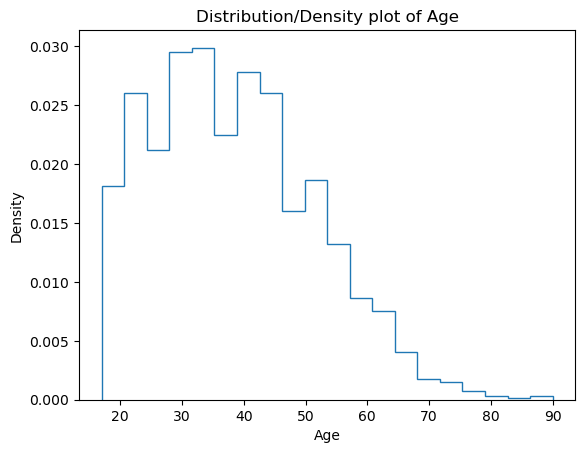

In [29]:
#checking the distribution of age column

plt.hist(df1['age'],bins=20, density=True, histtype='step')
plt.title('Distribution/Density plot of Age')
plt.xlabel('Age')
plt.ylabel('Density')
plt.show()

<Figure size 1010x606 with 0 Axes>

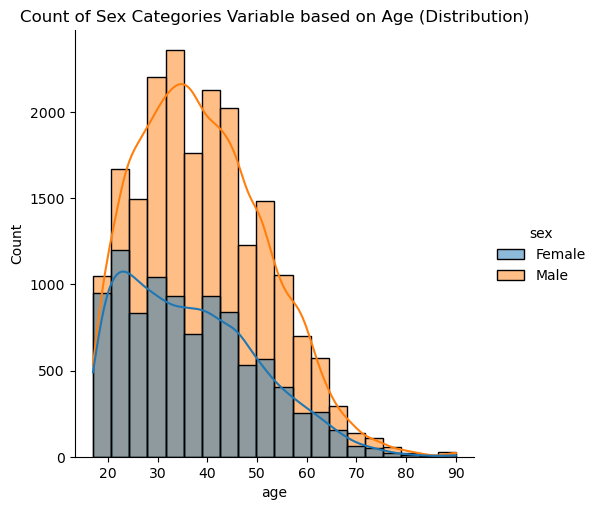

In [30]:
#comparing the distribution of males and females in age

plt.figure(figsize=(10,6),dpi=101)
ax=sns.displot(data=df1,x='age',bins=20,kde=True,hue='sex')
plt.title('Count of Sex Categories Variable based on Age (Distribution)')
plt.show()

<Figure size 1010x606 with 0 Axes>

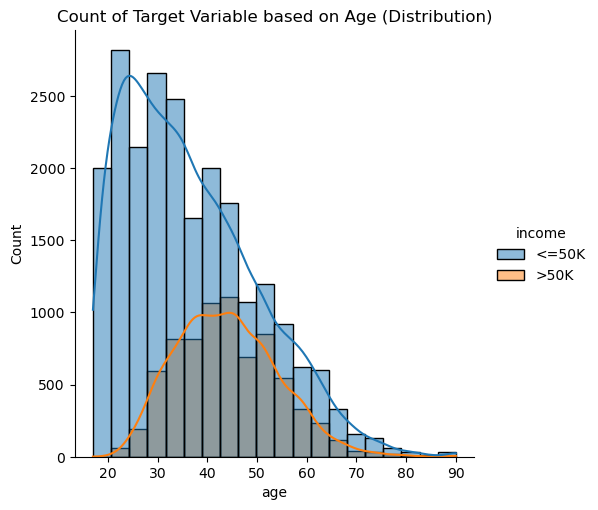

In [31]:
plt.figure(figsize=(10,6),dpi=101)
ax=sns.displot(data=df1,x='age',bins=20,kde=True,hue='income')
plt.title('Count of Target Variable based on Age (Distribution)')
plt.show()

**Inferences:**
- Age Column is visibly left-skewed
- Males outnumbers females in age-range of 30-60 years
- Young people are earning less than 50k but with experience few of them have got hike in salary

### `Sex`

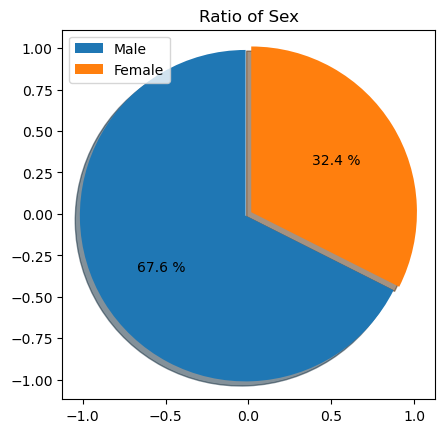

In [32]:
temp = df1['sex'].value_counts()
ax= plt.pie(temp,explode=[.02,.02], frame=True,shadow=True, autopct='%1.1f %%', startangle=90)
plt.legend(temp.index)
plt.title('Ratio of Sex')
plt.show()

**Inferences :**
- Imbalance of data 
- Females are less in any kind of working profession (Dependant on other people?)

### `Capital Gain and Loss`

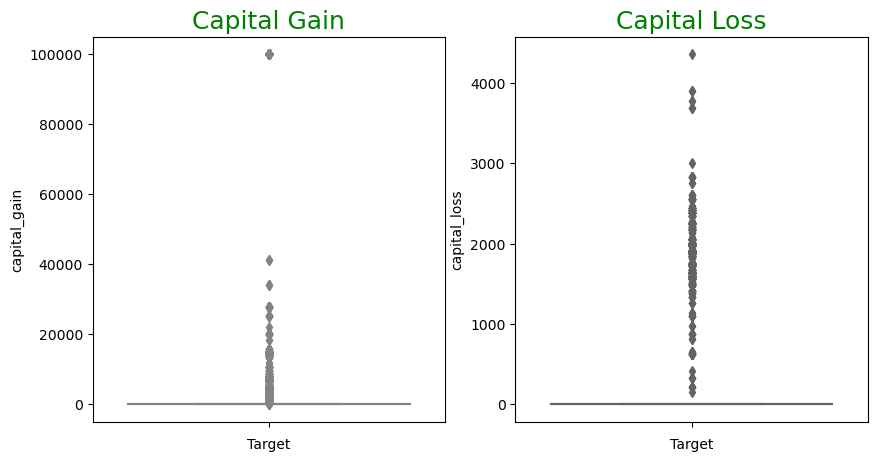

In [33]:
plt.figure(figsize=(10, 5))

plt.subplot(1,2,1)
sns.boxplot(data= df1, y= 'capital_gain', color = 'peachpuff')
plt.title(label = 'Capital Gain', color = 'green', fontsize = 18)

plt.xlabel('Target')

plt.subplot(1,2,2)
sns.boxplot(data= df1, y= 'capital_loss', color = 'rosybrown')
plt.title(label = 'Capital Loss', color = 'green', fontsize = 18)

plt.xlabel('Target')

plt.show()

In [34]:
import plotly.express as px
fig = px.scatter(df1, x="capital_loss", y="age", marginal_x="violin", marginal_y="box", title='Distribution of Capital Loss vs Age')
fig.show()

In [35]:
fig = px.scatter(df1, x=df1['capital_gain'], y="age", color="income", facet_col="sex", title='Distribution of Capital gain for different sex of different ages')#, facet_row="marital_status")
fig.show()

In [36]:
fig = px.scatter(df1, x=df1['capital_loss'], y="age", color="income", facet_col="sex", title='Distribution of Capital loss for different sex of different ages')#, facet_row="marital_status")
fig.show()

**Inference:**  
_capital_gain_ and _capital_loss_ have lots of zeroes which makes other points outliers in the dataset
but we need to keep the points as they are real data

### `Native Countries`

In [37]:
df1['native_country'].value_counts()

United-States                 27504
Mexico                          610
Philippines                     188
Germany                         128
Puerto-Rico                     109
Canada                          107
El-Salvador                     100
India                           100
Cuba                             92
England                          86
Jamaica                          80
South                            71
Italy                            68
China                            68
Dominican-Republic               67
Vietnam                          64
Guatemala                        63
Japan                            59
Poland                           56
Columbia                         56
Iran                             42
Taiwan                           42
Haiti                            42
Portugal                         34
Nicaragua                        33
Peru                             30
Greece                           29
Ecuador                     

**Inference :** United States are dominating the dataset

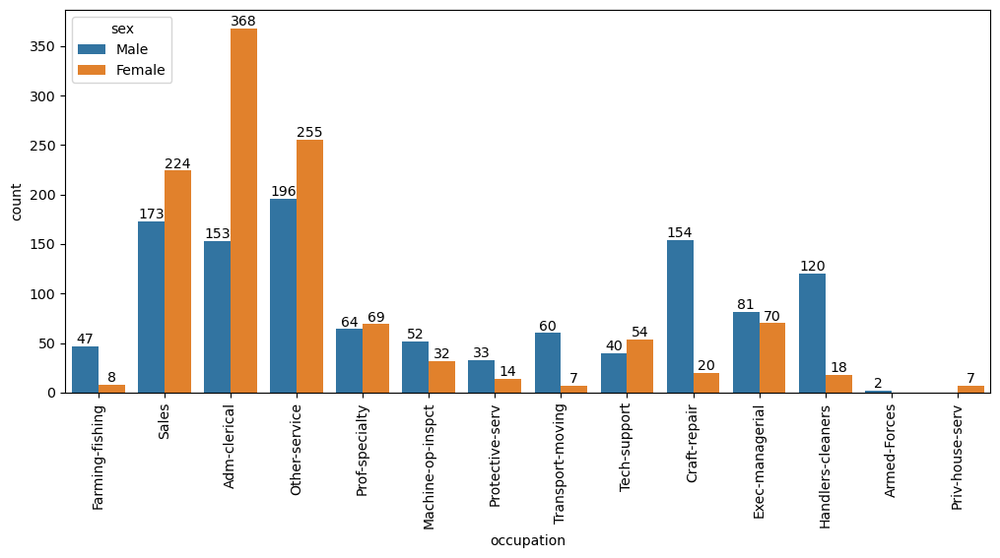

In [38]:
plt.figure(figsize=(12,5),dpi=101)
ax=sns.countplot(data=df1[(df1['income']=='<=50K')&(df1['marital_status']=='Never-married')&
                      (df1['native_country']=='United-States')&
                      (df1['education']==10)],x='occupation',hue='sex')
for i in ax.containers:
    ax.bar_label(i,)
plt.xticks(rotation = 90);
plt.show()

In [39]:
lll = df1[['native_country','income']].groupby('native_country').count()

In [40]:


# generate country code  based on country name 
import pycountry 
def alpha3code(column):
    CODE=[]
    for country in column:
        try:
            code=pycountry.countries.get(name=country).alpha_3
           # .alpha_3 means 3-letter country code 
           # .alpha_2 means 2-letter country code
            CODE.append(code)
        except:
            CODE.append('None')
    return CODE
# create a column for code 
lll['CODE']=alpha3code(lll.index)

In [41]:
lll

,income,CODE
native_country,,
Cambodia,18,KHM
Canada,107,CAN
China,68,CHN
Columbia,56,None
Cuba,92,CUB
Dominican-Republic,67,None
Ecuador,27,ECU
El-Salvador,100,None
England,86,None


**Inference ;** there are still none values which won't be printed in the plot. can be replaced manually if time

In [42]:
lll[lll['income'] >= 2000]

,income,CODE
native_country,,
United-States,27504,None


In [43]:
lll[lll['income'] >= 2000] = lll[lll['income'] >= 2000].replace("None","USA")

In [44]:
# first let us merge geopandas data with our data
# 'naturalearth_lowres' is geopandas datasets so we can use it directly
import geopandas
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
# rename the columns so that we can merge with our data
world.columns=['pop_est', 'continent', 'name', 'CODE', 'gdp_md_est', 'geometry']
# then merge with our data 
merge=pd.merge(world,lll,on='CODE')
# last thing we need to do is - merge again with our location data which contains each country’s latitude and longitude
location=pd.read_csv('https://raw.githubusercontent.com/melanieshi0120/COVID-19_global_time_series_panel_data/master/data/countries_latitude_longitude.csv')
merge=merge.merge(location,on='name').sort_values(by='income',ascending=False).reset_index()

In [45]:
merge.head(1)

,index,pop_est,continent,name,CODE,gdp_md_est,geometry,income,latitude,longitude
0,1,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",27504,37.09024,-95.712891


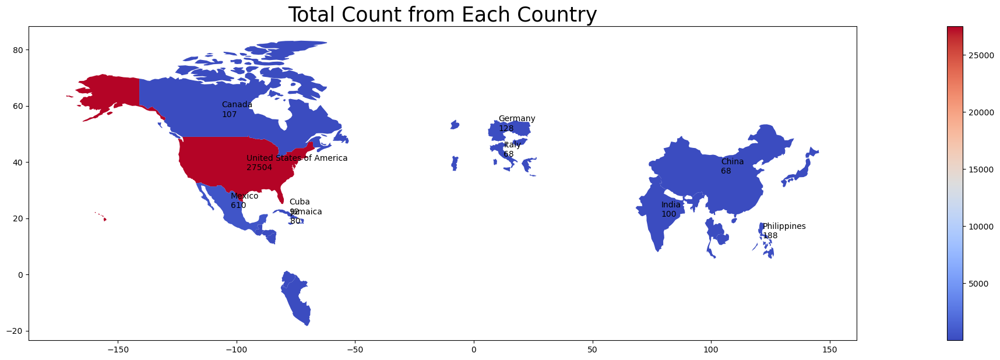

In [46]:
#plotting the total count for each country
merge.plot(column='income',
           figsize=(40, 7),
           legend=True,cmap='coolwarm')
plt.title('Total Count from Each Country',fontsize=25)
# add countries names and numbers 
for i in range(0,10):
    plt.text(float(merge.longitude[i]),float(merge.latitude[i]),"{}\n{}".format(merge.name[i],merge.income[i]),size=10)
plt.show()

Still so many values were None, and It was tedious task to change them manually. 

**Inference:**
- We can see that most of the dataset consist of united states which easily influence the race, occupation, sex and finally out target variable _income_ too....

### `Relationships`

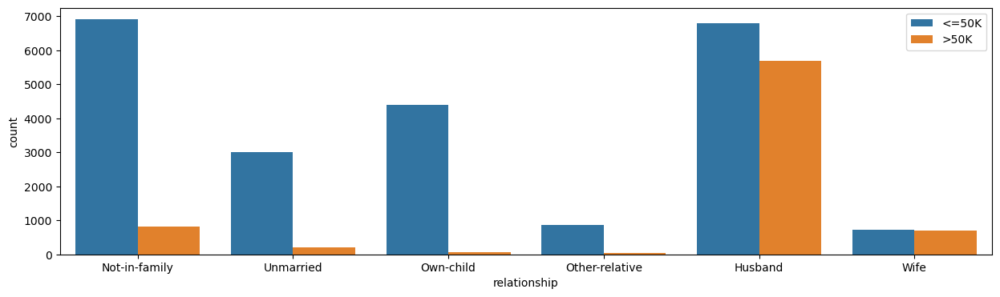

In [47]:
plt.figure(figsize=(15,4))
ax=sns.countplot(df1.relationship,hue=df1.income)
plt.legend(['<=50K', '>50K'])
plt.show()

**Inference :**
If not in family or Husbands are earning much more in both categories

### `Correlation Heatmap`

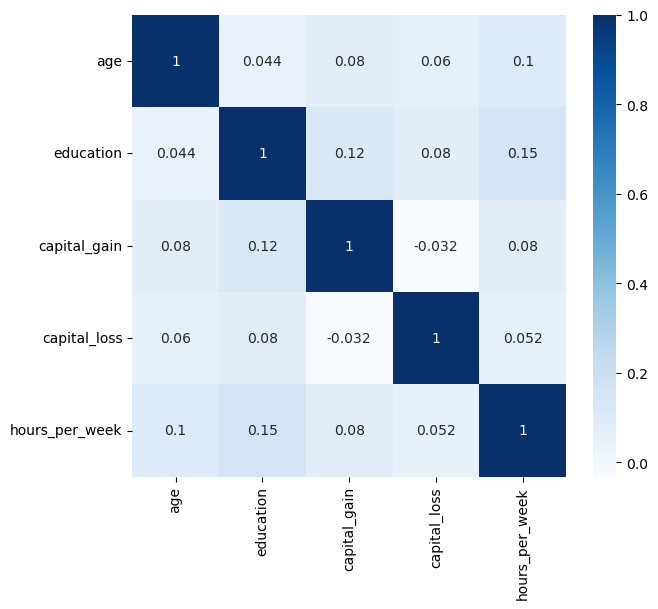

In [48]:
plt.figure(figsize=(7,6))
sns.heatmap(df1.corr(),annot=True,cmap='Blues')
plt.show()

**inference :** 
There is no high correlation between attributes but we can see the influence in the dataset

## `7. Feature  Engineering`

Creating two temporary dataset copy to work in models.  
- df_tmp : doesn't contain capital_gain, capital_loss
- df_tmp1 : contains all except target

In [49]:
df_tmp= df1.drop(columns=['capital_gain','capital_loss','income'])
df_tmp1= df1.drop(columns=['income'])

In [50]:
df_tmp = df_tmp.replace(to_replace=['>50K','<=50K'], value=['1','0'])
df_tmp1 = df_tmp1.replace(to_replace=['>50K','<=50K'], value=['1','0'])

In [51]:
#haven't done the encoding because get dummies were useful to do it

df_tmp=pd.get_dummies(df_tmp)
df_tmp1=pd.get_dummies(df_tmp1)

In [52]:
target = target.replace(to_replace=['>50K','<=50K'], value=['1','0'])

In [53]:
#contains only numerical columns of the datasets

numericalcols=list(df_tmp.select_dtypes(exclude='object').columns)
numericalcols1=list(df_tmp1.select_dtypes(exclude='object').columns)

In [54]:
#Scaling was required as dataset is heavily imbalanced in values of different columns which can be seen in the description of dataset

from sklearn.preprocessing import StandardScaler

M=StandardScaler()
df_tmp[numericalcols]=M.fit_transform(df_tmp[numericalcols])
df_tmp1[numericalcols1]=M.fit_transform(df_tmp1[numericalcols1])

In [55]:
df_tmp.head(1)

,age,education,hours_per_week,workclass_Federal-gov,workclass_Local-gov,workclass_Private,workclass_Self-emp-inc,workclass_Self-emp-not-inc,workclass_State-gov,workclass_Without-pay,...,native_country_Portugal,native_country_Puerto-Rico,native_country_Scotland,native_country_South,native_country_Taiwan,native_country_Thailand,native_country_Trinadad&Tobago,native_country_United-States,native_country_Vietnam,native_country_Yugoslavia
1,3.31663,-0.439738,-1.914161,-0.179648,-0.271241,0.594479,-0.192152,-0.300562,-0.210433,-0.021549,...,-0.033593,-0.060224,-0.019101,-0.048575,-0.037342,-0.023747,-0.024436,0.310871,-0.046113,-0.023038


In [56]:
df_tmp.head(1)

,age,education,hours_per_week,workclass_Federal-gov,workclass_Local-gov,workclass_Private,workclass_Self-emp-inc,workclass_Self-emp-not-inc,workclass_State-gov,workclass_Without-pay,...,native_country_Portugal,native_country_Puerto-Rico,native_country_Scotland,native_country_South,native_country_Taiwan,native_country_Thailand,native_country_Trinadad&Tobago,native_country_United-States,native_country_Vietnam,native_country_Yugoslavia
1,3.31663,-0.439738,-1.914161,-0.179648,-0.271241,0.594479,-0.192152,-0.300562,-0.210433,-0.021549,...,-0.033593,-0.060224,-0.019101,-0.048575,-0.037342,-0.023747,-0.024436,0.310871,-0.046113,-0.023038


## `8. Model`

In [57]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import  LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import BaggingClassifier

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

### `9.1 With Imbalance Response Variable`

In [58]:
X_train, X_test, y_train, y_test = train_test_split(df_tmp, target, test_size=0.2, random_state=101)

#### `9.1.1. Logistic Regression`

In [59]:
model1 = LogisticRegression()

In [60]:
model1.fit(X_train, y_train)

LogisticRegression()

In [61]:
y_pred1 = model1.predict(X_test)

In [62]:
print(f"Score of Training dataset: \t{round(model1.score(X_train, y_train)*100,3)}%")
print(f"Score of Test dataset: \t\t{round(model1.score(X_test, y_test)*100,3)}%")

Score of Training dataset: 	83.257%
Score of Test dataset: 		82.878%


In [63]:
print(classification_report(y_test,y_pred1))

              precision    recall  f1-score   support

           0       0.86      0.92      0.89      4503
           1       0.70      0.57      0.63      1530

    accuracy                           0.83      6033
   macro avg       0.78      0.74      0.76      6033
weighted avg       0.82      0.83      0.82      6033



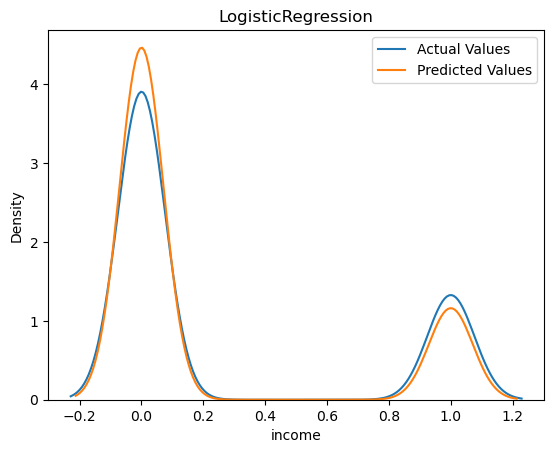

In [64]:
ax=sns.distplot(y_test,hist=False,label='Actual Values')
ax=sns.distplot(y_pred1,hist=False,label='Predicted Values')
ax.set_title('LogisticRegression')
ax.legend()
plt.show()

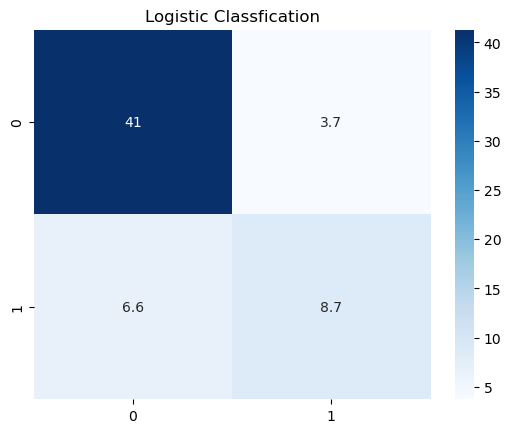

In [65]:
sns.heatmap(confusion_matrix(y_test,y_pred1)/100,annot=True,cmap='Blues')
plt.title('Logistic Classfication')
plt.show()

#### `9.1.2. K-Nearest Neighbours`

In [66]:
knn = KNeighborsClassifier()

In [67]:
param_grid={'n_neighbors':list(range(1,31))}

In [68]:
grid_model=GridSearchCV(knn,param_grid=param_grid,cv=5,scoring='accuracy')

In [69]:
grid_model.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30]},
             scoring='accuracy')

In [70]:
grid_model.best_estimator_.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 16,
 'p': 2,
 'weights': 'uniform'}

In [71]:
y_pred2= grid_model.predict(X_test)

In [72]:
print(f"Score of Training dataset: \t{round(grid_model.score(X_train, y_train)*100,3)}%")
print(f"Score of Test dataset: \t\t{round(grid_model.score(X_test, y_test)*100,3)}%")

Score of Training dataset: 	84.347%
Score of Test dataset: 		81.85%


In [73]:
print(classification_report(y_test,y_pred2))

              precision    recall  f1-score   support

           0       0.86      0.91      0.88      4503
           1       0.67      0.55      0.61      1530

    accuracy                           0.82      6033
   macro avg       0.76      0.73      0.74      6033
weighted avg       0.81      0.82      0.81      6033



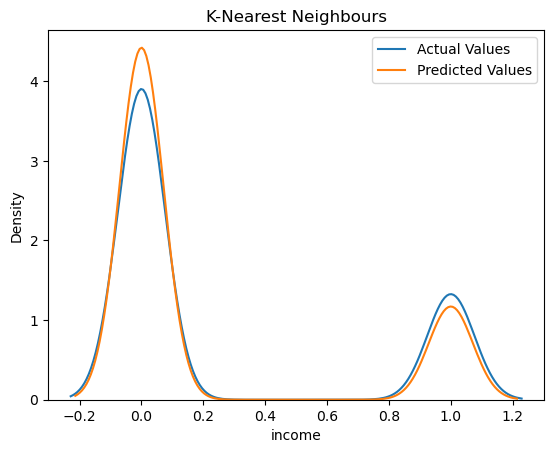

In [74]:
ax=sns.distplot(y_test,hist=False,label='Actual Values')
ax=sns.distplot(y_pred2,hist=False,label='Predicted Values')
ax.set_title('K-Nearest Neighbours')
plt.legend()
plt.show()

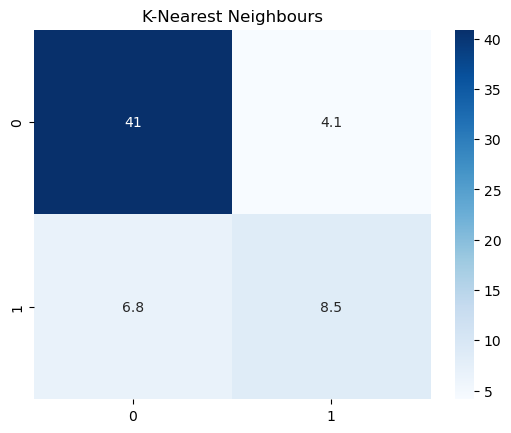

In [75]:
sns.heatmap(confusion_matrix(y_test,y_pred2)/100,annot=True,cmap='Blues')
plt.title('K-Nearest Neighbours')
plt.show()

#### `9.1.3. Support Vector Machines`

In [76]:
model3 = SVC()

In [77]:
model3.fit(X_train, y_train)

SVC()

In [78]:
y_pred3 = model3.predict(X_test)

In [79]:
print(f"Score of Training dataset: \t{round(model3.score(X_train, y_train)*100,3)}%")
print(f"Score of Test dataset: \t\t{round(model3.score(X_test, y_test)*100,3)}%")

Score of Training dataset: 	83.248%
Score of Test dataset: 		82.065%


In [80]:
print(classification_report(y_test,y_pred3))

              precision    recall  f1-score   support

           0       0.85      0.92      0.88      4503
           1       0.69      0.53      0.60      1530

    accuracy                           0.82      6033
   macro avg       0.77      0.72      0.74      6033
weighted avg       0.81      0.82      0.81      6033



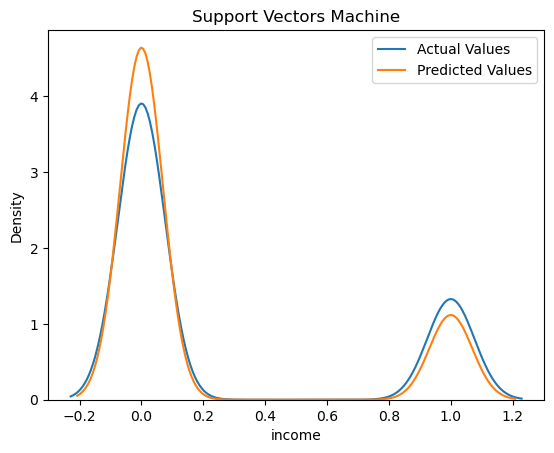

In [81]:
ax=sns.distplot(y_test,hist=False,label='Actual Values')
ax=sns.distplot(y_pred3,hist=False,label='Predicted Values')
ax.set_title('Support Vectors Machine')
plt.legend()
plt.show()

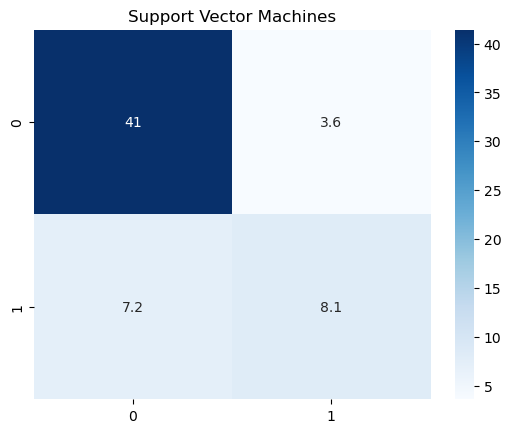

In [82]:
sns.heatmap(confusion_matrix(y_test,y_pred3)/100,annot=True,cmap='Blues')
plt.title('Support Vector Machines')
plt.show()

#### `9.1.4. Naive-Bayes`

In [83]:
model4 = GaussianNB() 

In [84]:
model4.fit(X_train, y_train)

GaussianNB()

In [85]:
y_pred6 = model4.predict(X_test)

In [86]:
print(f"Score of Training dataset: \t{round(model4.score(X_train, y_train)*100,3)}%")
print(f"Score of Test dataset: \t\t{round(model4.score(X_test, y_test)*100,3)}%")

Score of Training dataset: 	49.422%
Score of Test dataset: 		49.594%


In [87]:
print(classification_report(y_test,y_pred6))

              precision    recall  f1-score   support

           0       0.96      0.34      0.50      4503
           1       0.33      0.96      0.49      1530

    accuracy                           0.50      6033
   macro avg       0.65      0.65      0.50      6033
weighted avg       0.80      0.50      0.50      6033



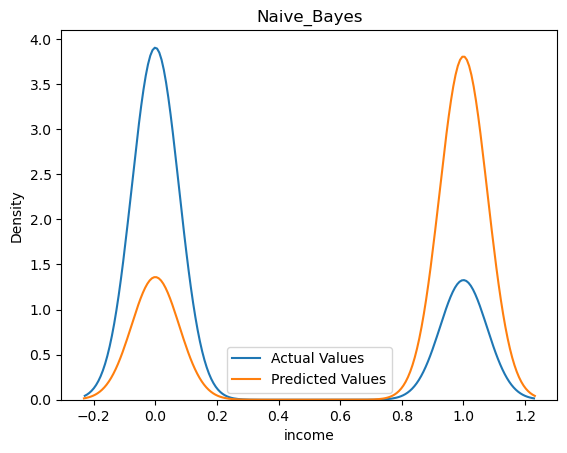

In [88]:
ax=sns.distplot(y_test,hist=False,label='Actual Values')
ax=sns.distplot(y_pred6,hist=False,label='Predicted Values')
ax.set_title('Naive_Bayes')
plt.legend()
plt.show()

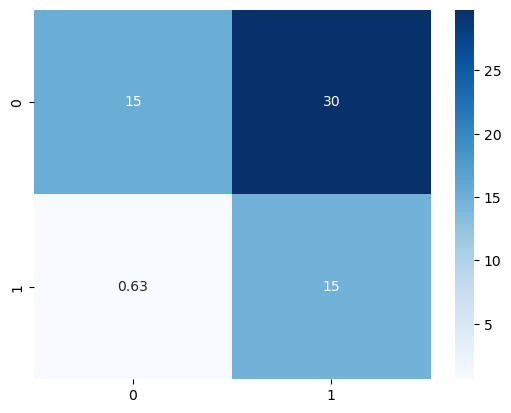

In [89]:
sns.heatmap(confusion_matrix(y_test,y_pred6)/100,annot=True,cmap='Blues')
plt.show()

#### `9.1.5. Random Forest`

In [90]:
model5 = RandomForestClassifier(n_estimators=70)

In [91]:
model5.fit(X_train, y_train)

RandomForestClassifier(n_estimators=70)

In [92]:
y_pred4 = model5.predict(X_test)

In [93]:
print(f"Score of Training dataset: \t{round(model5.score(X_train, y_train)*100,3)}%")
print(f"Score of Test dataset: \t\t{round(model5.score(X_test, y_test)*100,3)}%")

Score of Training dataset: 	96.813%
Score of Test dataset: 		81.585%


In [94]:
print(classification_report(y_test,y_pred4))

              precision    recall  f1-score   support

           0       0.86      0.90      0.88      4503
           1       0.66      0.56      0.61      1530

    accuracy                           0.82      6033
   macro avg       0.76      0.73      0.74      6033
weighted avg       0.81      0.82      0.81      6033



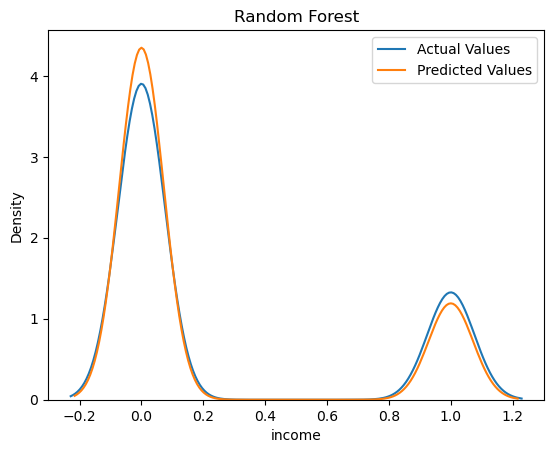

In [95]:
ax=sns.distplot(y_test,hist=False,label='Actual Values')
ax=sns.distplot(y_pred4,hist=False,label='Predicted Values')
ax.set_title('Random Forest')
plt.legend()
plt.show()

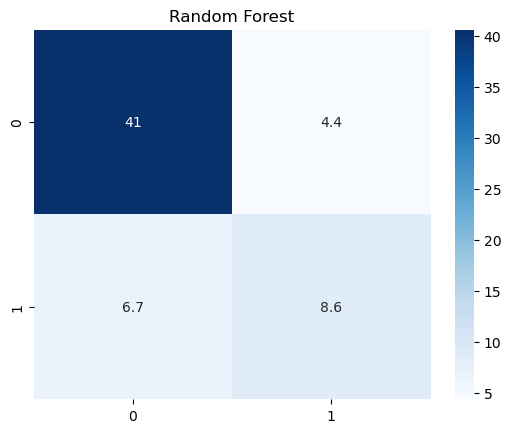

In [96]:
sns.heatmap(confusion_matrix(y_test,y_pred4)/100,annot=True,cmap='Blues')
plt.title('Random Forest')
plt.show()

#### `9.1.6. Decision Tree Classifier`

In [97]:
model6 = DecisionTreeClassifier()
model6.fit(X_train, y_train)
y_pred6 = model6.predict(X_test)

In [98]:
print(f"Score of Training dataset: \t{round(model6.score(X_train, y_train)*100,3)}%")
print(f"Score of Test dataset: \t\t{round(model6.score(X_test, y_test)*100,3)}%")

Score of Training dataset: 	96.842%
Score of Test dataset: 		78.17%


In [99]:
print(classification_report(y_test,y_pred6))

              precision    recall  f1-score   support

           0       0.84      0.87      0.86      4503
           1       0.58      0.53      0.55      1530

    accuracy                           0.78      6033
   macro avg       0.71      0.70      0.70      6033
weighted avg       0.78      0.78      0.78      6033



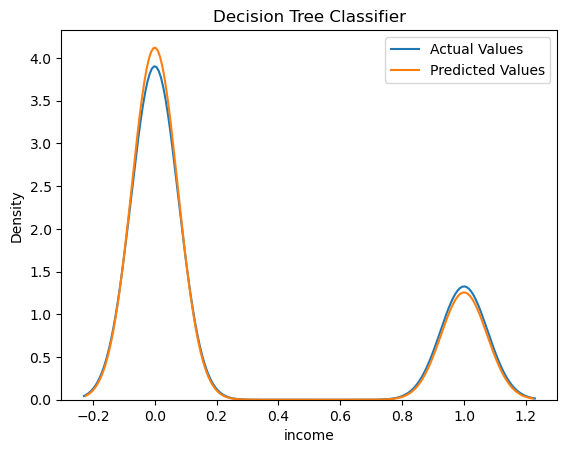

In [100]:
ax=sns.distplot(y_test,hist=False,label='Actual Values')
ax=sns.distplot(y_pred6,hist=False,label='Predicted Values')
ax.set_title('Decision Tree Classifier')
plt.legend()
plt.show()

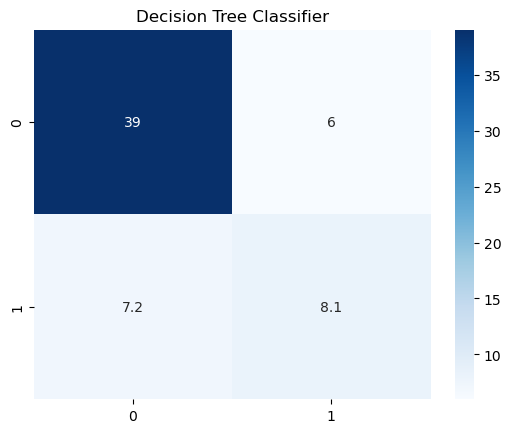

In [101]:
sns.heatmap(confusion_matrix(y_test,y_pred6)/100,annot=True,cmap='Blues')
plt.title('Decision Tree Classifier')
plt.show()

### `9.2 Modeling with Balanced Dataset`

In [102]:
numericalcols=list(X_train.select_dtypes(exclude='object').columns)

In [103]:
target[0:10]

1     0
3     0
4     0
5     0
6     0
7     1
8     0
10    1
11    1
12    1
Name: income, dtype: object

`SMOTE` : Synthetic Minority Oversampling Technique  

One way to solve this problem is to oversample the examples in the minority class. This can be achieved by simply duplicating examples from the minority class in the training dataset prior to fitting a model. This can balance the class distribution but does not provide any additional information to the model.

An improvement on duplicating examples from the minority class is to synthesize new examples from the minority class. This is a type of data augmentation for tabular data and can be very effective.

Perhaps the most widely used approach to synthesizing new examples is called the Synthetic Minority Oversampling TEchnique, or SMOTE for short. This technique was described by Nitesh Chawla, et al. in their 2002 paper named for the technique titled “SMOTE: Synthetic Minority Over-sampling Technique.”

In [104]:
from imblearn.over_sampling import SMOTE
X_resampled, y_resampled = SMOTE().fit_resample(X_train[numericalcols], y_train[:])

In [105]:
X_resampled.head(1)

,age,education,hours_per_week,workclass_Federal-gov,workclass_Local-gov,workclass_Private,workclass_Self-emp-inc,workclass_Self-emp-not-inc,workclass_State-gov,workclass_Without-pay,...,native_country_Portugal,native_country_Puerto-Rico,native_country_Scotland,native_country_South,native_country_Taiwan,native_country_Thailand,native_country_Trinadad&Tobago,native_country_United-States,native_country_Vietnam,native_country_Yugoslavia
0,-0.109476,-0.439738,-0.244682,-0.179648,-0.271241,0.594479,-0.192152,-0.300562,-0.210433,-0.021549,...,-0.033593,16.604686,-0.019101,-0.048575,-0.037342,-0.023747,-0.024436,-3.216773,-0.046113,-0.023038


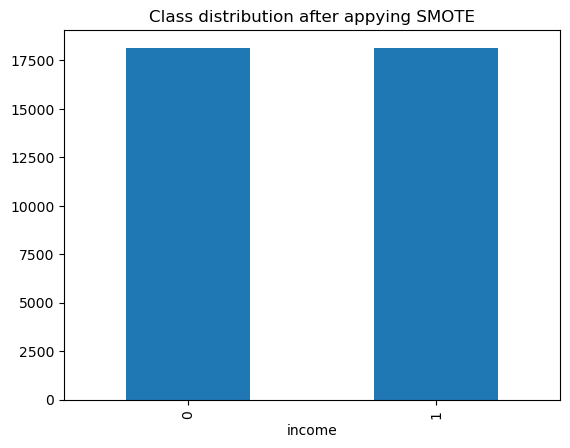

In [106]:
pd.Series(y_resampled).value_counts().plot(kind='bar', title='Class distribution after appying SMOTE', xlabel='income')
plt.show()

#### `9.2.1 Logistic Regression`

In [107]:
model7 = LogisticRegression()
model7.fit(X_resampled, y_resampled)
y_pred7 = model7.predict(X_test)

In [108]:
print(classification_report(y_test,y_pred7))

              precision    recall  f1-score   support

           0       0.93      0.78      0.85      4503
           1       0.56      0.83      0.67      1530

    accuracy                           0.79      6033
   macro avg       0.74      0.80      0.76      6033
weighted avg       0.84      0.79      0.80      6033



#### `9.2.2 K-Nearest neighbours`

In [109]:
knn1 = KNeighborsClassifier()

In [110]:
param_grid={'n_neighbors':list(range(1,31))}

In [111]:
grid_model1=GridSearchCV(knn1,param_grid=param_grid,cv=5,scoring='accuracy')

In [112]:
grid_model1.fit(X_resampled,y_resampled)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30]},
             scoring='accuracy')

In [113]:
y_pred8= grid_model1.predict(X_test)

In [114]:
print(f"Score of Training dataset: \t{round(grid_model1.score(X_resampled, y_resampled)*100,3)}%")
print(f"Score of Test dataset: \t\t{round(grid_model1.score(X_test, y_test)*100,3)}%")

Score of Training dataset: 	97.088%
Score of Test dataset: 		77.043%


In [115]:
print(classification_report(y_test,y_pred8))

              precision    recall  f1-score   support

           0       0.86      0.83      0.84      4503
           1       0.54      0.60      0.57      1530

    accuracy                           0.77      6033
   macro avg       0.70      0.71      0.71      6033
weighted avg       0.78      0.77      0.77      6033



#### `9.2.3 Decision Tree Classifier`

In [116]:
model9 = DecisionTreeClassifier()

In [117]:
model9.fit(X_resampled, y_resampled)

DecisionTreeClassifier()

In [118]:
y_pred9 = model9.predict(X_test)

In [119]:
print(f"Score of Training dataset: \t{round(model9.score(X_resampled, y_resampled)*100,3)}%")
print(f"Score of Test dataset: \t\t{round(model9.score(X_test, y_test)*100,3)}%")

Score of Training dataset: 	97.711%
Score of Test dataset: 		77.225%


In [120]:
print(classification_report(y_test,y_pred9))

              precision    recall  f1-score   support

           0       0.85      0.85      0.85      4503
           1       0.55      0.54      0.55      1530

    accuracy                           0.77      6033
   macro avg       0.70      0.70      0.70      6033
weighted avg       0.77      0.77      0.77      6033



#### `9.2.4 Random Tree Classifier`

In [121]:
model10 = RandomForestClassifier(n_estimators=70)

In [122]:
model10.fit(X_resampled, y_resampled)

RandomForestClassifier(n_estimators=70)

In [123]:
y_pred10 = model10.predict(X_test)

In [124]:
print(classification_report(y_test, y_pred10))

              precision    recall  f1-score   support

           0       0.87      0.87      0.87      4503
           1       0.61      0.63      0.62      1530

    accuracy                           0.80      6033
   macro avg       0.74      0.75      0.74      6033
weighted avg       0.81      0.80      0.81      6033



***
**Inference:**  
Stopped the modelling because accuracy kept decreasing for all models with SMOTE data  
**BUT** Recall and Precision are almost equal for SMOTE data

In [125]:
!pip install xgboost

In [126]:
from xgboost import plot_tree
from sklearn.model_selection import StratifiedKFold

In [127]:
import xgboost as xgb

In [128]:
# A parameter grid for XGBoost
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 5, 7, 10],
        'learning_rate': [0.01, 0.02, 0.05]    
        }

In [129]:
skf = StratifiedKFold(n_splits = 10, shuffle = True)